In [1]:
%run './model/multi_corpus.py'
%run './model/ergm_functions.py'
%run './constants.py'

import polars as pl
from netgraph import Graph, ArcDiagram
from itertools import accumulate
import operator
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from collections import defaultdict
import itertools

import math


import seaborn as sns
from IPython.display import display, clear_output

In [2]:
# T test variance for SVD measure

# Consider each path independently 

In [3]:
corpora = co_occurence_graphs(n_edges=100)
Gs = {field_name: corpus['G'] for (field_name, corpus) in corpora.items()}
Dfs = {field_name: corpus['Df'] for (field_name, corpus) in corpora.items()}

Gender Studies Graph with 57 nodes and 100 edges
Geometry Graph with 61 nodes and 100 edges
Geophysics Graph with 63 nodes and 100 edges
Economics Graph with 50 nodes and 100 edges
Language & Linguistics Graph with 58 nodes and 100 edges
Probability & Statistics Graph with 58 nodes and 100 edges
Material Engineering Graph with 49 nodes and 100 edges
Artificial Intelligence Graph with 49 nodes and 100 edges
Sociology Graph with 76 nodes and 100 edges
International Business Graph with 51 nodes and 100 edges
Political Science Graph with 56 nodes and 100 edges
Genetics & Genomics Graph with 71 nodes and 100 edges
Immunology Graph with 92 nodes and 100 edges
Human Resources & Organizations Graph with 66 nodes and 100 edges
Ethnic & Cultural Studies Graph with 52 nodes and 100 edges
Neurology Graph with 46 nodes and 100 edges


In [7]:
corpora = co_occurence_graphs(n_edges=100)
Gs = {field_name: corpus['G'] for (field_name, corpus) in corpora.items()}
Dfs = {field_name: corpus['Df'] for (field_name, corpus) in corpora.items()}

Gender Studies Graph with 57 nodes and 100 edges
Geometry Graph with 61 nodes and 100 edges
Geophysics Graph with 63 nodes and 100 edges
Economics Graph with 50 nodes and 100 edges
Language & Linguistics Graph with 58 nodes and 100 edges
Probability & Statistics Graph with 58 nodes and 100 edges
Material Engineering Graph with 49 nodes and 100 edges
Artificial Intelligence Graph with 49 nodes and 100 edges
Sociology Graph with 76 nodes and 100 edges
International Business Graph with 51 nodes and 100 edges
Political Science Graph with 56 nodes and 100 edges
Genetics & Genomics Graph with 71 nodes and 100 edges
Immunology Graph with 92 nodes and 100 edges
Human Resources & Organizations Graph with 66 nodes and 100 edges
Ethnic & Cultural Studies Graph with 52 nodes and 100 edges
Neurology Graph with 46 nodes and 100 edges


In [3]:
# sample_size = 5000
# n_edges = 100

# dfs_temporal_path = './dfs_temporal'

# for field_name, df in Dfs.items():

#     print(field_name)

#     df_temporal_path = os.path.join(dfs_temporal_path, field_name)
#     if not os.path.exists(df_temporal_path):
#         os.mkdir(df_temporal_path)

#     df_edges = {}
#     for year in df['Date'].dt.year().unique().sort():
        
#         df_edge = (
#             df
#             .sample(min(df.height, sample_size))
#             .select(pl.col('Date').dt.year(), 'Text')

#             .filter(pl.col('Date').le(year))
            
#             .filter(pl.col('Text').arr.lengths().gt(1))
#             .with_columns(pl.col('Text').arr.sort())
#             .with_columns(pl.col('Text').apply(lambda a: list(combinations(a, 2))))
#         )

#         try:
#             df_edge = (
#                 df_edge
#                 .explode('Text')
#                 .with_columns(
#                     pl.col('Text').arr.first().alias('u'),
#                     pl.col('Text').arr.last().alias('v'),
#                 )
#                 .filter(pl.col('u').ne(pl.col('v')))
#                 .groupby(['u', 'v'])
#                 .agg(pl.count().alias('Count'))
#                 .filter(pl.col('Count').gt(1))
#                 .sort('Count', descending=True)
#                 .head(n_edges)
#             )
#         except:
#             print(year, df_edge)
#             break

#         df_edge.write_parquet(os.path.join(df_temporal_path, f'{year}.parquet'))

# clear_output(wait=True)

In [2]:
dfs_temporal_path = './dfs_temporal'

dfs_temporal = defaultdict(dict)

for field_name in os.listdir(dfs_temporal_path):

    dfs_year_path = os.path.join(dfs_temporal_path, field_name)
    for df_year_path in os.listdir(dfs_year_path):

        year = df_year_path.split('.')[0]
        df_year = pl.read_parquet(os.path.join(dfs_temporal_path, field_name, df_year_path))

        dfs_temporal[field_name][int(year)] = df_year

# Global Measurements

In [4]:
def nodes(G):
    return len(G.nodes)

def diameter(G):
    return nx.diameter(G)

def density(G):
    return nx.density(G)

def shortest_path(G):
    return nx.average_shortest_path_length(G)

def transitivity(G):
    return nx.transitivity(G)

def centralization(G):
    # degree_centralities = nx.degree_centrality(G).values()
    degree_centralities = nx.betweenness_centrality(G).values()
    C_max = max(degree_centralities)
    n = G.number_of_nodes()
    centralization = sum(C_max - C for C in degree_centralities) / ((n-1) * (n-2))
    return min(1., centralization)

def community(G):
    return len(nx_comm.louvain_communities(G))

def clustering(G):
    return nx.average_clustering(G)

measures = [nodes, density, transitivity, centralization, community, clustering] # transitivity, centralization, community, clustering, diameter, shortest_path


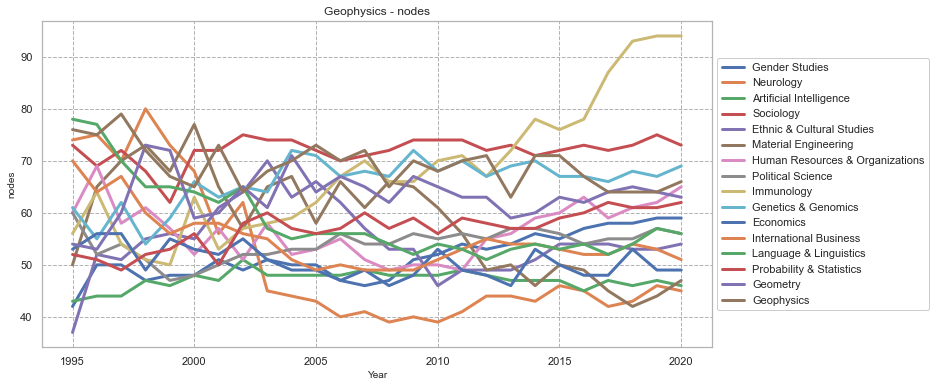

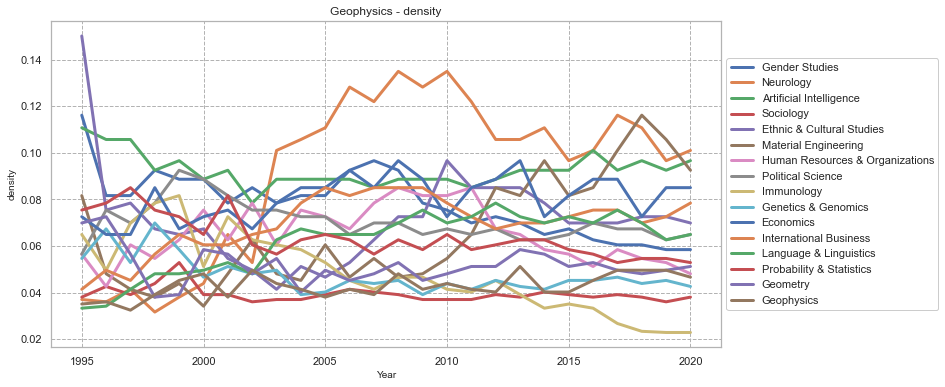

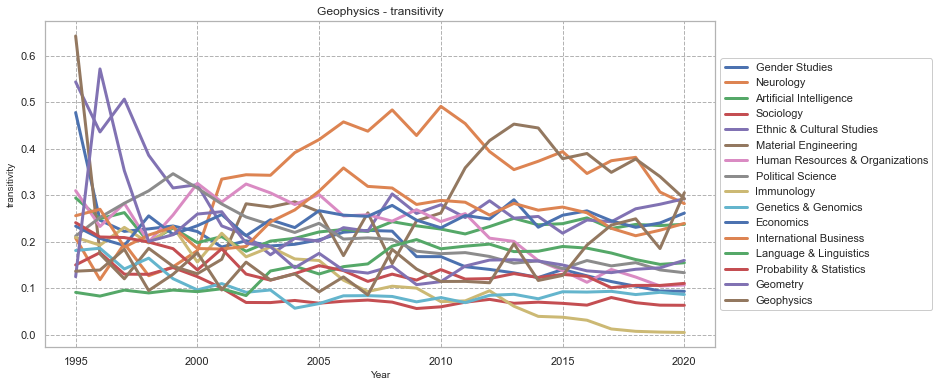

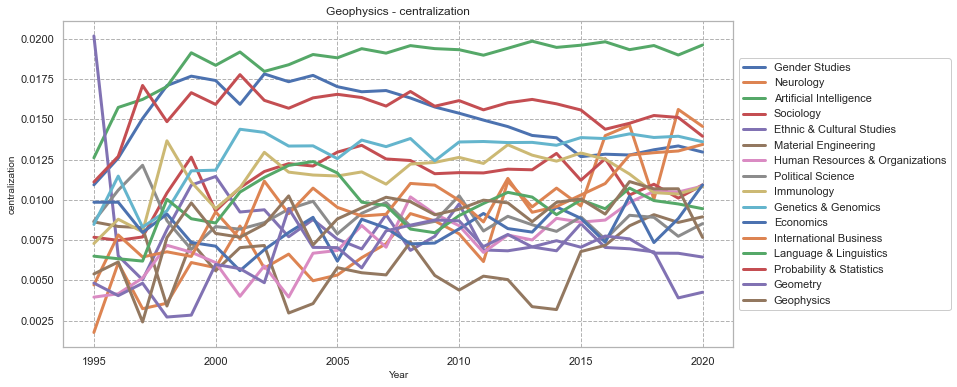

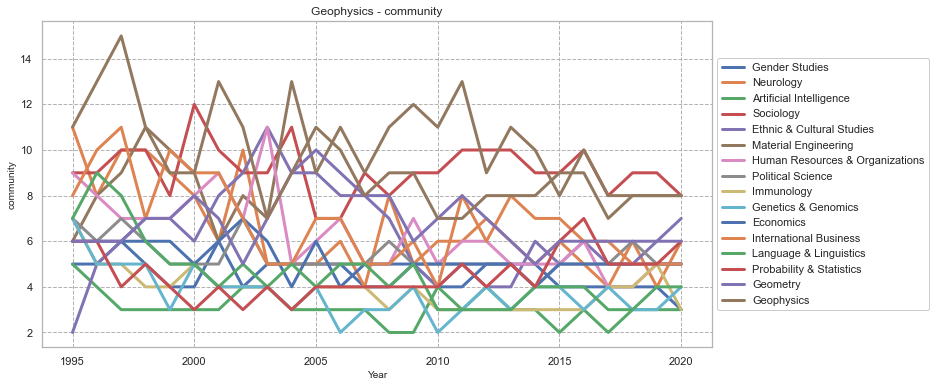

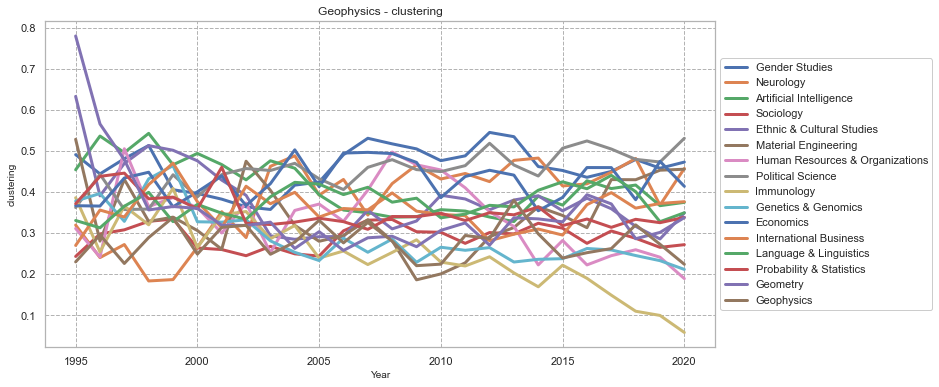

In [10]:
measurements = {}
for measure in measures:

    all_data = pl.DataFrame()

    for field_name, dfs in dfs_temporal.items():

        m = defaultdict(list)
        for year, df in sorted(dfs.items(), key=lambda tup: tup[0]):

            G = nx.Graph()
            G.add_weighted_edges_from(df.rows())

            m['Date'].append(year)
            m[field_name].append(measure(G))

        df = pl.DataFrame(m)

        if all_data.is_empty():
            all_data = df
        else:
            all_data = all_data.join(df, on='Date', how='left')

    all_data = all_data.filter(pl.col('Date').ge(1995))

    x = all_data['Date']
    ys = all_data.select(pl.all().exclude('Date'))

    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
    trace = ax.plot(x, ys, linewidth=3)

    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel(f'{measure.__name__}', fontsize=10)
    ax.set_title(f'{field_name} - {measure.__name__}', fontsize=12)
    ax.grid(True, which="both", ls="--", c='0.7')

    ax.set_facecolor('white')
    ax.spines['bottom'].set_color('0.7')
    ax.spines['top'].set_color('0.7')
    ax.spines['right'].set_color('0.7')
    ax.spines['left'].set_color('0.7')

    ax.legend(trace, [s.name for s in ys], facecolor='white', framealpha=1, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

    measurements[measure.__name__] = all_data


# Temporal Graphs

In [ ]:
# Longevity

# Regression 
# Centralization on Time

# % var explained by first dim regress on time

# positive coef increasing centralization
# negative coef decreasing centralization

# LOCAL
# Regress diff time t and t+1 against time t

# Ch 2
Compare disc on how centralized they are around dominant community

# Ch 3
Compare disc in terms of how much mobility there is around communities

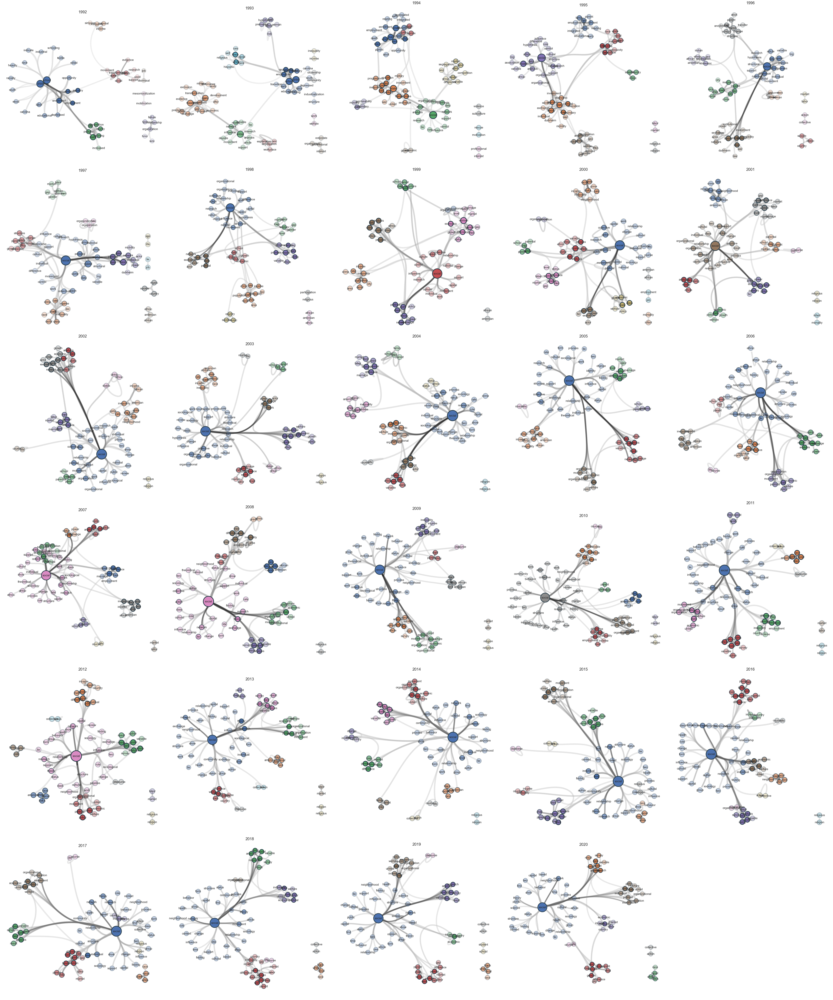

In [3]:
field_name = 'Sociology'
dfs = dfs_temporal[field_name]

num_years = len(dfs)
rows = int(np.ceil(np.sqrt(num_years)))
cols = int(np.ceil(num_years / rows))

fig, axes = plt.subplots(rows, cols, figsize=(12 * cols, 12 * rows))

if rows > 1 and cols > 1:
    axes = axes.ravel()
else:
    axes = [axes]

for idx, (year, df) in enumerate(sorted(dfs.items(), key=lambda tup: tup[0])):

    print(year), clear_output(wait=True)

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())

    communities = nx_comm.louvain_communities(G)
    num_comms = len(communities)
    communities = {node: i for i, comm in enumerate(communities) for node in comm}

    node_size = dict(nx.degree(G))
    node_size = {node: max(2, np.log(size)) for node, size in node_size.items()}

    comm_color = sns.color_palette(n_colors=num_comms)
    node_color = {node: comm_color[i] for node, i in communities.items()}

    node_alpha = nx.core_number(G)
    max_core = max(node_alpha.values())
    node_alpha = {n: core / max_core for n, core in node_alpha.items()}

    node_labels = dict(zip(G.nodes, G.nodes))

    ax = axes[idx]

    Graph(
        G,
        edge_layout='bundled',
        node_layout='community',
        node_size=node_size,
        node_color=node_color,
        node_labels=True,
        node_label_fontdict={'size': 15},
        node_label_offset=0.00,
        node_alpha=node_alpha,
        ax=ax,
        node_layout_kwargs=dict(node_to_community=communities)
    )

    ax.patch.set_alpha(0)
    ax.set_title(f'{year}', fontsize=20)

for i in range(num_years, rows * cols):
    axes[i].axis('off')

# fig.suptitle(f'Temporal {field_name}', fontsize=20)

plt.tight_layout()
fig.savefig(f'./latex/figures/co_occurrence_temporal_graphs/{field_name}.png', dpi=300, transparent=True)

plt.show()

# Temporal Dendrograms

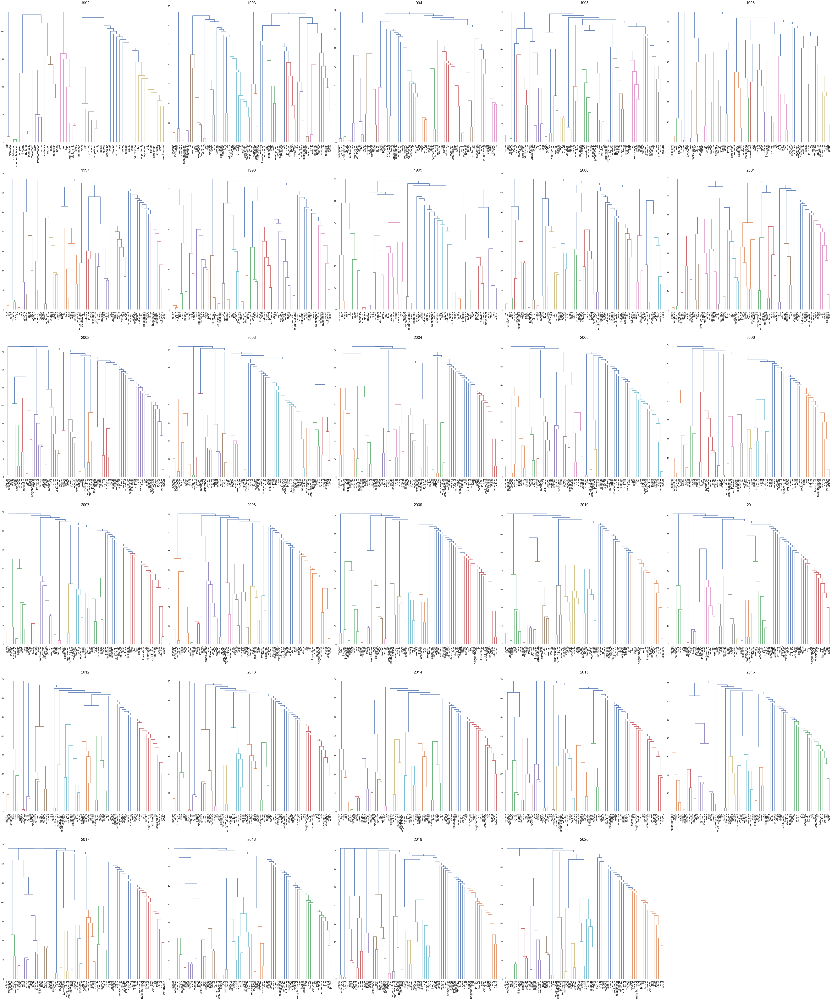

In [8]:
import scipy
import itertools

field_name = 'Sociology'
dfs = dfs_temporal[field_name]

method = 'grivan_newman' # louvain, girvan_newman

num_years = len(dfs)
rows = int(np.ceil(np.sqrt(num_years)))
cols = int(np.ceil(num_years / rows))

fig, axes = plt.subplots(rows, cols, figsize=(12 * cols, 12 * rows))

if rows > 1 and cols > 1:
    axes = axes.ravel()
else:
    axes = [axes]

for idx, (year, df) in enumerate(sorted(dfs.items(), key=lambda tup: tup[0])):

    print(year), clear_output(wait=True)

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())

    communities = nx_comm.louvain_communities(G)
    num_comms = len(communities)
    communities = {node: i for i, comm in enumerate(communities) for node in comm}

    node_size = dict(nx.degree(G))
    node_size = {node: max(2, np.log(size)) for node, size in node_size.items()}

    comm_color = sns.color_palette(n_colors=num_comms)
    node_color = {node: comm_color[i] for node, i in communities.items()}

    node_alpha = nx.core_number(G)
    max_core = max(node_alpha.values())
    node_alpha = {n: core / max_core for n, core in node_alpha.items()}

    node_labels = dict(zip(G.nodes, G.nodes))

    if method == 'louvain':
        hier_comms = list(nx.community.louvain_partitions(G, weight='weight', resolution=1, threshold=1e-07, seed=None))
        hier_comms.append([{node} for community in hier_comms[-1] for node in community])
    if method == 'grivan_newman':
        hier_comms = list(nx.community.girvan_newman(G))

    nodes = set.union(*hier_comms[-1])
    ids = dict(zip(nodes, range(len(nodes))))

    M_dst = np.full((len(nodes), len(nodes)), len(hier_comms))

    dsts = []
    modularities = []
    for i, level in enumerate(hier_comms):
        modularity = nx.community.modularity(G, level, weight='weight', resolution=1)
        modularities.append(modularity)
        dst = len(hier_comms) - i - 1
        for cluster in level:
            for u, v in itertools.combinations(cluster, 2):
                M_dst[ids[u]][ids[v]] = dst
                M_dst[ids[v]][ids[u]] = dst
        dsts.append(dst)

    np.fill_diagonal(M_dst, 0)
    A_dst = scipy.spatial.distance.squareform(M_dst)
    M_linkage = scipy.cluster.hierarchy.linkage(A_dst)

    ax = axes[idx]

    scipy.cluster.hierarchy.dendrogram(M_linkage, labels=list(ids.keys()), leaf_rotation=90., leaf_font_size=15, ax=ax)

    ax.patch.set_alpha(0)
    ax.set_title(f'{year}', fontsize=20)

for i in range(num_years, rows * cols):
    axes[i].axis('off')

# fig.suptitle(f'Temporal {field_name}', fontsize=20)

plt.tight_layout()
fig.savefig(f'./latex/figures/co_occurrence_temporal_dendros/{field_name}.png', dpi=300, transparent=True)

plt.show()

# Temporal Communities

In [10]:
field_name = 'Genetics & Genomics'
dfs = dfs_temporal[field_name]

Gs_temporal = {}
for year, df in dfs.items():

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())

    Gs_temporal[year] = G

In [11]:
import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

In [12]:
def jaccard(c1, c2):
    intersection = set(c1).intersection(set(c2))
    union = set(c1).union(set(c2))
    jaccard = len(intersection) / len(union)
    return jaccard

/var/folders/rz/n4jmlyh1355cy_wkn5gd00x40000gn/T/ipykernel_14717/334055267.py:183: DeprecationWarning: `alltrue` is deprecated as of NumPy 1.25.0, and will be removed in NumPy 2.0. Please use `all` instead.
  nx.draw_networkx_edges(


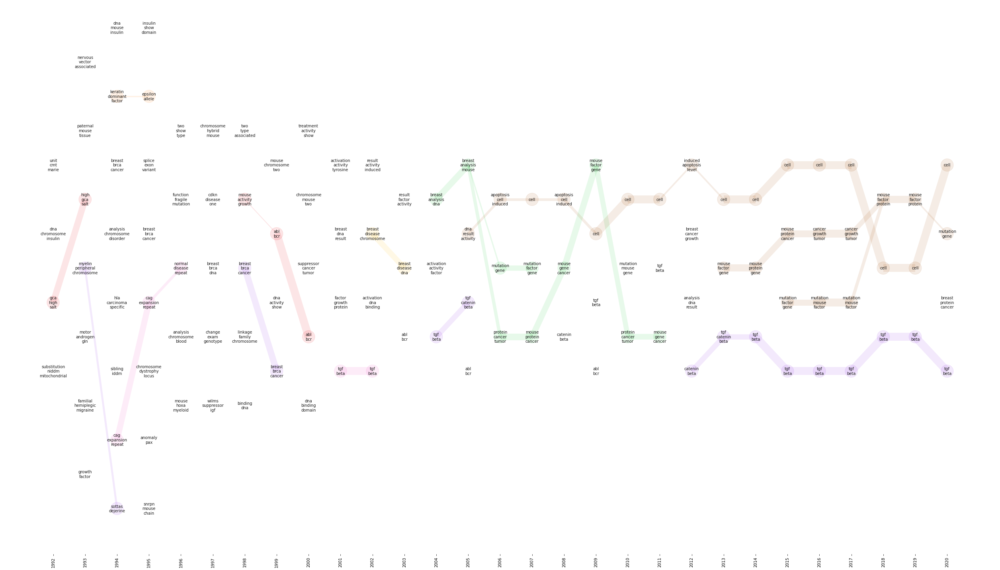

In [13]:
term = 'network'

similarity_threshold = 0.7
core_threshold = 3 # n == keep only most n most core values (n == keep all nodes that have a core of max(core) - n)

node_size = 1000
alpha = 0.1

tree = nx.Graph()
t_max = max(Gs_temporal.keys())
t_min = min(Gs_temporal.keys())

for t in sorted(Gs_temporal.keys())[:-1]:

    G_t = Gs_temporal[t]
    G_t1 = Gs_temporal[t+1]

    communities_t = nx_comm.louvain_communities(G_t, seed=123)
    communities_t1 = nx_comm.louvain_communities(G_t1, seed=123)

    centrality_t = nx.betweenness_centrality(G_t)
    centrality_t1 = nx.betweenness_centrality(G_t1)

    coreness_t = nx.core_number(G_t)
    coreness_t1 = nx.core_number(G_t1)

    for community_t, community_t1 in itertools.product(communities_t, communities_t1):
        core_community_t = dict(filter(lambda tup: tup[0] in community_t, coreness_t.items()))
        core_community_t = dict(filter(lambda tup: tup[1] >= max(core_community_t.values())-core_threshold, core_community_t.items()))
        core_community_t = dict(sorted(core_community_t.items(), key=lambda tup: tup[1]))
        core_community_t = frozenset(core_community_t.keys())

        node_t = (t, core_community_t)

        core_community_t1 = dict(filter(lambda tup: tup[0] in community_t1, coreness_t1.items()))
        core_community_t1 = dict(filter(lambda tup: tup[1] >= max(core_community_t1.values())-core_threshold, core_community_t1.items()))
        core_community_t1 = dict(sorted(core_community_t1.items(), key=lambda tup: tup[1]))
        core_community_t1 = frozenset(core_community_t1.keys())

        node_t1 = (t+1, core_community_t1)

        rank_community_t = sum([d['weight'] for (_, _, d) in G_t.subgraph(community_t).edges(data=True)])
        rank_community_t1 = sum([d['weight'] for (_, _, d) in G_t1.subgraph(community_t1).edges(data=True)])

        layer_community_t = t-t_min
        layer_community_t1 = t+1-t_min

        if node_t not in tree:
            tree.add_node(node_t, layer=layer_community_t, date=t, rank=rank_community_t)
        if node_t1 not in tree:
            tree.add_node(node_t1, layer=layer_community_t1, date=t+1, rank=rank_community_t1)

        similarity = jaccard(core_community_t, core_community_t1)

        similar_enough = similarity >= similarity_threshold
        is_subset = core_community_t.issubset(core_community_t1) or core_community_t1.issubset(core_community_t)
        contains_gt = len(set(list(core_community_t)[:3]).intersection(set(list(core_community_t1)[:3]))) >= 1
        # contains_gt = len(core_community_t.intersection(core_community_t1)) >= 2

        if similar_enough or is_subset:
            tree.add_edge(node_t, node_t1, similarity=similarity)

pos = nx.multipartite_layout(tree, subset_key='layer')

## Distant Components

# components = list(nx.connected_components(tree))
# node_component = {node: i for i, component in enumerate(components) for node in component}

# nodes_min = []
# nodes_max = []
# for component in components:
#     date_min = min([date for (date, _) in component])
#     date_max = max([date for (date, _) in component])

#     node_min = [(date, node) for (date, node) in component if date == date_min]
#     node_max = [(date, node) for (date, node) in component if date == date_max]

#     nodes_min += node_min
#     nodes_max += node_max

# for (date_min, node_min), (date_max, node_max) in itertools.product(nodes_min, nodes_max):

#     similarity = jaccard(node_min, node_max)

#     similar_enough = similarity >= similarity_threshold
#     # print(similar_enough)
#     is_subset = node_min.issubset(node_max) or node_max.issubset(node_min)
#     # print(is_subset)
#     not_exists = not tree.has_edge((date_min, node_min), (date_max, node_max))
#     # print(not_exists)
#     not_same = not (date_min, node_min) == (date_max, node_max)
#     # print(not_same)
#     ordered = date_min < date_max
    

#     if not_exists and not_same and ordered and (similar_enough or is_subset):
#         tree.add_edge((date_max, node_max), (date_min, node_min), similarity=similarity, temporary=True)


## Rank Y axis pos by 'rank' attribute

# node_pos_layers = defaultdict(dict)
# node_rank_layers = defaultdict(dict)
# for (node, attrs) in tree.nodes(data=True):
#     node_pos_layers[attrs['layer']][node] = pos[node]
#     node_rank_layers[attrs['layer']][node] = attrs['rank']

# node_pos_layers = dict(sorted(node_pos_layers.items(), key=lambda tup: tup[0]))
# node_rank_layers = dict(sorted(node_rank_layers.items(), key=lambda tup: tup[0]))

# node_pos_layers = [sorted(layer.items(), key=lambda tup: tup[1][1], reverse=True) for layer in node_pos_layers.values()]
# node_rank_layers = [sorted(layer.items(), key=lambda tup: tup[1], reverse=True) for layer in node_rank_layers.values()]

# for node_pos, node_rank in zip(node_pos_layers, node_rank_layers):
#     node_pos = [node for node, _ in node_pos]
#     node_rank = [node for node, _ in node_rank]
#     for u, v in zip(node_pos, node_rank):
#         pos[u], pos[v] = pos[v], pos[u]

## NODE LABELS

node_labels = {}
for node in tree.nodes:
    node_labels[node] = '\n'.join(list(node[1])[:3])

## NODE & EDGE COLOR

connected_components = list(nx.connected_components(tree))
color_palette = sns.color_palette('bright', n_colors=len(connected_components))

node_colors = {}
edge_colors = {}
node_alphas = {}
edge_alphas = {}
for i, component in enumerate(connected_components):

    component_color = color_palette[i]
    component_size = len(component)
    
    if len(component) > 1:
        node_colors.update(zip(component, [component_color]*component_size))
        node_alphas.update(zip(component, [alpha]*component_size))
    else:
        node_colors.update(zip(component, ['white']*component_size))
        node_alphas.update(zip(component, [0]*component_size))

    for edge in tree.subgraph(component).edges():
        
        edge_colors[frozenset(edge)] = color_palette[i]

        # if 'temporary' in tree.get_edge_data(*edge):
        #     edge_alphas[frozenset(edge)] = 0
        # else:
        edge_alphas[frozenset(edge)] = alpha

node_colors = [node_colors[node] for node in tree.nodes]
edge_colors = [edge_colors[frozenset(edge)] for edge in tree.edges]

node_alphas = [node_alphas[node] for node in tree.nodes]
edge_alphas = [edge_alphas[frozenset(edge)] for edge in tree.edges]

## EDGE WIDTH 

edge_width = [tree[u][v]['similarity']*20 for (u, v) in tree.edges]

fig, ax = plt.subplots(1, figsize=(35, 20))

nx.draw_networkx_nodes(
    tree, 
    pos,
    nodelist=tree.nodes,
    node_size=node_size,
    node_color=node_colors,
    node_shape='o',
    alpha=node_alphas,
    # cmap=plt.cm.Blues,
    ax=ax,
)

nx.draw_networkx_labels(G, pos=pos, ax=ax, labels=node_labels, font_size=10)

nx.draw_networkx_edges(
    tree, 
    pos,
    edgelist=tree.edges,
    width=edge_width,
    style='solid',
    alpha=edge_alphas,
    arrowsize=10,
    arrows=False,
    ax=ax,
    edge_color=edge_colors,
    nodelist=tree.nodes,
    node_size=node_size,
    node_shape='o',
    connectionstyle='arc3',
)

ax.set_facecolor('white')

ax.tick_params(left=False, bottom=True, labelleft=False, labelbottom=True)

xs, _ = zip(*pos.values())
ax.set_xticks(sorted(set(xs)))
ax.set_xticklabels(sorted(Gs_temporal.keys()), rotation=90)

ax.set_xlim(min(xs)-0.1, max(xs)+0.1)

for pos in ['right', 'top', 'bottom', 'left']:
   plt.gca().spines[pos].set_visible(False)

plt.tight_layout()
plt.show()

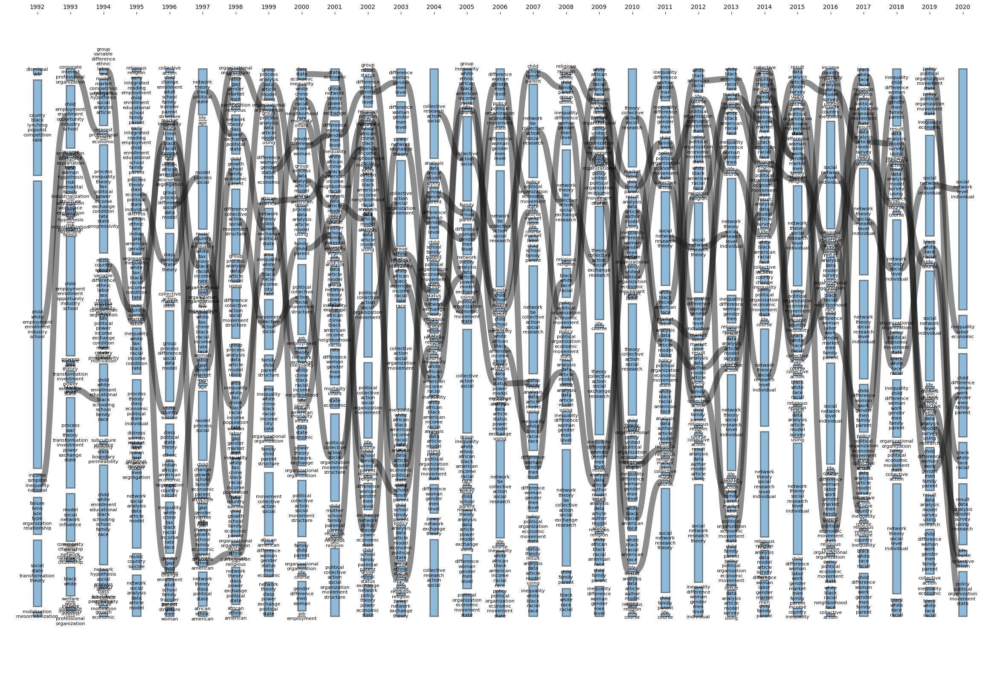

In [118]:
import numpy as np
import bezier

import matplotlib.pyplot as plt
import matplotlib.patches as patches

from matplotlib.path import Path
from matplotlib.patches import PathPatch

width = 0.5
x_padding = 2
y_padding = 0.01
rect_alpha = 0.5

years = set(sorted(map(lambda t: t[0], nodes)))
t_max = max(years)

xs = np.arange(0, len(years)*x_padding, x_padding)

xs_min = min(xs)
xs_max = max(xs)

fig, ax = plt.subplots(figsize=(30, 20))

rect_centers = {}
rect_sizes = {}

for i, year in enumerate(years):
    x = xs[i]

    nodes_t = list(filter(lambda t: t[0] == year, nodes))

    total_size = sum(s for _, _, s in nodes_t)
    
    total_y_padding = y_padding * (len(nodes_t) - 1)
    available_height = 1 - total_y_padding
    normalization_factor = available_height / total_size
    
    start_height = 0
    for _, terms, size in nodes_t:
        height = size * normalization_factor
        rect = patches.Rectangle((x - width/2, start_height), width, height, linewidth=2, edgecolor='k', facecolor=None, alpha=rect_alpha)

        label = '\n'.join(terms)
        ax.text(x, start_height + height/2, label, ha='center', va='center', fontsize=8)
        
        rect_centers[(year, frozenset(terms))] = (x, start_height + height/2)
        rect_sizes[(year, frozenset(terms))] = height

        start_height += height + y_padding
        ax.add_patch(rect)

for edge in edges:
    (year1, labels1), (year2, labels2), weight = edge

    x1, y1 = rect_centers[(year1, frozenset(labels1))]
    x2, y2 = rect_centers[(year2, frozenset(labels2))]
    
    x1 = x1 + (width / 2)
    x2 = x2 - (width / 2)

    control_x1 = (x1 + x2) / 2
    control_y1 = y1
    control_x2 = (x1 + x2) / 2
    control_y2 = y2

    path = Path([(x1, y1), (control_x1, control_y1), (control_x2, control_y2), (x2, y2)], [Path.MOVETO, Path.CURVE4, Path.CURVE4, Path.CURVE4])
    patch = PathPatch(path, facecolor='none', lw=10, edgecolor='k', alpha=0.5)

    ax.add_patch(patch)

ax.set_xticks(xs)
ax.set_xticklabels(years)

ax.yaxis.set_visible(False)
ax.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)
ax.spines['bottom'].set_visible(False)
ax.spines['left'].set_visible(False)
ax.xaxis.tick_top()
ax.set_xlim(xs_min - x_padding, xs_max + x_padding)
ax.set_ylim(-0.1, 1.1)
plt.show()


In [227]:
df_nodes = defaultdict(list)

for t in sorted(Gs_temporal.keys()):
    G_t = Gs_temporal[t]
    communities_t = nx_comm.louvain_communities(G_t, seed=123)
    for community_t in communities_t:
        df_nodes['Date'].append(t)
        df_nodes['Community'].append(community_t)

df_nodes = (
        pl.from_dict(df_nodes)
        .with_row_count(name='Id')
        .with_columns(
            pl.col('Date')
            .sub(pl.col('Date').min())
            .truediv(pl.col('Date').max().sub(pl.col('Date').min()))
            .alias('X')
        )
        .group_by('Date')
        .map_groups(
            lambda group:
                group
                .with_row_count(name='GroupId')
                .with_columns(
                    pl.col('GroupId')
                    .sub(pl.col('GroupId').min())
                    .truediv(pl.col('GroupId').max().sub(pl.col('GroupId').min()))
                    .alias('Y')
                )
        )
        .sort('Id')
        .drop('GroupId')
)

df_nodes.height, df_nodes.head()

(265,
 shape: (5, 5)
 ┌─────┬──────┬───────────────────────────────────┬─────┬──────────┐
 │ Id  ┆ Date ┆ Community                         ┆ X   ┆ Y        │
 │ --- ┆ ---  ┆ ---                               ┆ --- ┆ ---      │
 │ u32 ┆ i64  ┆ object                            ┆ f64 ┆ f64      │
 ╞═════╪══════╪═══════════════════════════════════╪═════╪══════════╡
 │ 0   ┆ 1992 ┆ {'heavily', 'wood', 'race', 'sch… ┆ 0.0 ┆ 0.0      │
 │ 1   ┆ 1992 ┆ {'populist', 'competition', 'bla… ┆ 0.0 ┆ 0.166667 │
 │ 2   ┆ 1992 ┆ {'support', 'evidence', 'used', … ┆ 0.0 ┆ 0.333333 │
 │ 3   ┆ 1992 ┆ {'organization', 'hmo', 'type', … ┆ 0.0 ┆ 0.5      │
 │ 4   ┆ 1992 ┆ {'national', 'inequality', 'inco… ┆ 0.0 ┆ 0.666667 │
 └─────┴──────┴───────────────────────────────────┴─────┴──────────┘)

In [228]:
similarity_threshold = 1

df_edges = defaultdict(list)

dates = df_nodes['Date'].unique().sort()

for t in dates[:-1]:

    df_t = df_nodes.filter(pl.col('Date').eq(t))
    df_t1 = df_nodes.filter(pl.col('Date').eq(t+1))

    communities_t = df_t[['Id', 'Community']].rows()
    communities_t1 = df_t1[['Id', 'Community']].rows()

    for (id_t, community_t), (id_t1, community_t1) in itertools.product(communities_t, communities_t1):

        similarity = jaccard(community_t, community_t1)

        similar_enough = similarity >= similarity_threshold
        is_subset = core_community_t.issubset(core_community_t1) or core_community_t1.issubset(core_community_t)
        
        if similar_enough or is_subset:
            df_edges['Source'].append(id_t)
            df_edges['Target'].append(id_t1)
            df_edges['Similarity'].append(similarity)
            df_edges['Color'].append('rgba(0,0,0,1)')

df_edges = pl.from_dict(df_edges)
df_edges.height, df_edges.head()

(100,
 shape: (5, 4)
 ┌────────┬────────┬────────────┬───────────────┐
 │ Source ┆ Target ┆ Similarity ┆ Color         │
 │ ---    ┆ ---    ┆ ---        ┆ ---           │
 │ i64    ┆ i64    ┆ f64        ┆ str           │
 ╞════════╪════════╪════════════╪═══════════════╡
 │ 20     ┆ 31     ┆ 1.0        ┆ rgba(0,0,0,1) │
 │ 31     ┆ 41     ┆ 1.0        ┆ rgba(0,0,0,1) │
 │ 34     ┆ 44     ┆ 1.0        ┆ rgba(0,0,0,1) │
 │ 41     ┆ 52     ┆ 1.0        ┆ rgba(0,0,0,1) │
 │ 49     ┆ 60     ┆ 1.0        ┆ rgba(0,0,0,1) │
 └────────┴────────┴────────────┴───────────────┘)

In [229]:
isolates = set(df_edges['Source'].to_list() + df_edges['Target'].to_list()).symmetric_difference(set(df_nodes['Id'].to_list()))

df_edges_isolates = defaultdict(list)

for isolate in set(isolates):
    df_edges_isolates['Source'].append(isolate)
    df_edges_isolates['Target'].append(isolate)
    df_edges_isolates['Similarity'].append(1.)
    df_edges_isolates['Color'].append('rgba(0,0,0,0)')

df_edges_isolates = pl.from_dict(df_edges_isolates)
df_edges_isolates.height, df_edges_isolates.head()

(133,
 shape: (5, 4)
 ┌────────┬────────┬────────────┬───────────────┐
 │ Source ┆ Target ┆ Similarity ┆ Color         │
 │ ---    ┆ ---    ┆ ---        ┆ ---           │
 │ i64    ┆ i64    ┆ f64        ┆ str           │
 ╞════════╪════════╪════════════╪═══════════════╡
 │ 0      ┆ 0      ┆ 1.0        ┆ rgba(0,0,0,0) │
 │ 1      ┆ 1      ┆ 1.0        ┆ rgba(0,0,0,0) │
 │ 2      ┆ 2      ┆ 1.0        ┆ rgba(0,0,0,0) │
 │ 3      ┆ 3      ┆ 1.0        ┆ rgba(0,0,0,0) │
 │ 4      ┆ 4      ┆ 1.0        ┆ rgba(0,0,0,0) │
 └────────┴────────┴────────────┴───────────────┘)

In [230]:
df_edges = pl.concat([df_edges, df_edges_isolates], rechunk=True)
df_edges.height, df_edges.head()

(233,
 shape: (5, 4)
 ┌────────┬────────┬────────────┬───────────────┐
 │ Source ┆ Target ┆ Similarity ┆ Color         │
 │ ---    ┆ ---    ┆ ---        ┆ ---           │
 │ i64    ┆ i64    ┆ f64        ┆ str           │
 ╞════════╪════════╪════════════╪═══════════════╡
 │ 20     ┆ 31     ┆ 1.0        ┆ rgba(0,0,0,1) │
 │ 31     ┆ 41     ┆ 1.0        ┆ rgba(0,0,0,1) │
 │ 34     ┆ 44     ┆ 1.0        ┆ rgba(0,0,0,1) │
 │ 41     ┆ 52     ┆ 1.0        ┆ rgba(0,0,0,1) │
 │ 49     ┆ 60     ┆ 1.0        ┆ rgba(0,0,0,1) │
 └────────┴────────┴────────────┴───────────────┘)

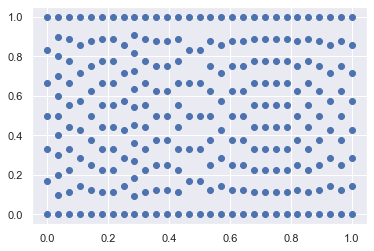

In [231]:
plt.scatter(df_nodes['X'].to_list(), df_nodes['Y'].to_list())
plt.show()

In [233]:
import pandas as pd
import plotly.graph_objects as go

labels = ['<br>'.join(list(com)[:3]) for com in df_nodes['Community']]

fig = go.Figure(
    go.Sankey(
        arrangement="snap",
        node = {
            #line = dict(color = "black", width = 0.5),
            "label" : labels,
            "x" : df_nodes['X'].to_list(),
            "y" : df_nodes['Y'].to_list(),
            'pad' : 10,
            },
        link = {
            # "source" : list(range(len(labels))),
            # "target" : list(range(len(labels))),
            # "value" : ([1.] * len(labels)),
            "source" : df_edges['Source'].to_list(),
            "target" : df_edges['Target'].to_list(),
            "value" : df_edges['Similarity'].to_list(),
            "color" : df_edges['Color'].to_list(),
        }
    )
)

fig.update_layout(title_text="Basic Sankey Diagram", font_size=10, height=1000, width=1600)
fig.show()

In [10]:
import pandas as pd
import plotly.graph_objects as go

labels = ['2005_1', '2006_1', '2006_4', '2007_3', '2006_5', '2007_2', '2006_6', '2007_4', '2007_1', '2008_2', '2007_5', '2008_9', '2007_6', '2008_4', '2007_7', '2008_3', '2008_6', '2007_8', '2008_1', '2007_9', '2008_5', '2009_1', '2005_2']
print(len(labels))
print(labels[22])


fig = go.Figure(
    go.Sankey(
        arrangement="snap",
        node = {
            #line = dict(color = "black", width = 0.5),
            "label" : labels,
            "x" : [0, 0.2, 0.2, 0.3, 0.2, 0.3, 0.2, 0.3, 0.3, 0.4, 0.3, 0.4, 0.3, 0.4, 0.3, 0.4, 0.4, 0.3, 0.4, 0.3, 0.4, 1.0, 1.0],
            "y" : [0, 0.1, 0.2, 0.1, 0.3, 0.2, 0.4, 0.3, 0.4, 0.1, 0.5, 0.2, 0.6, 0.3, 0.7, 0.4, 0.5, 0.8, 0.6, 0.9, 0.7, 1.0, 0.0],
            'pad' : 10,
            },
        link = {
            "source" : [0, 2, 4, 6, 8, 10, 12, 14, 14, 17, 19, 7, 21, 22],
            "target" : [1, 3, 5, 7, 9, 11, 13, 15, 16, 18, 20, 18, 21, 22],
            "value" : [0.4, 0.6, 0.8, 0.7, 0.5, 0.4, 0.8, 1.5, 1.2, 2.8, 0.9, 0.5, 0.6, 0.1],
            # "color" :  ['rgba(255,0,255,0)'] * len([0.4, 0.6, 0.8, 0.7, 0.5, 0.4, 0.8, 1.5, 1.2, 2.8, 0.9, 0.5, 0.6, 0.1])
        }
    )
)

fig.update_layout(title_text="Basic Sankey Diagram", font_size=10)
fig.show()

23
2005_2


In [3]:
import plotly.graph_objects as go

fig = go.Figure(go.Sankey(
    arrangement = "snap",
    node = {
        "label": ["A", "B", "C", "D", "E", "F"],
        "x": [0.1, 0.1, 0.5, 0.7, 0.3, 0.5],
        "y": [0.5, 0.5, 0.2, 0.4, 0.2, 0.3],
        'pad':10},  # 10 Pixels
    link = {
        "source": [0, 0, 1, 2, 5, 4, 3, 5],
        "target": [5, 3, 4, 3, 0, 2, 2, 3],
        "value": [1, 2, 1, 1, 1, 1, 1, 2]}))

fig.show()

In [167]:
components = list(nx.connected_components(tree))
for i, component in enumerate(components):
    component = sorted(component, key=lambda t: t[0])
    tail = component[-1]
    print(tail)


(1993, frozenset({'employment', 'enrollment', 'opportunity', 'industry', 'child', 'school'}))
(1993, frozenset({'transformation', 'power', 'investment', 'state', 'exchange', 'process', 'theory', 'war'}))
(1993, frozenset({'model', 'social', 'network', 'influence'}))
(2020, frozenset({'race', 'white', 'black', 'racial'}))
(1993, frozenset({'workplace', 'sex', 'segregation', 'explanation'}))
(1993, frozenset({'family', 'premarital', 'woman', 'birth', 'risk', 'hypothesis'}))
(1994, frozenset({'interest', 'professional'}))
(1993, frozenset({'welfare', 'work'}))
(1993, frozenset({'community', 'citizenship'}))
(1994, frozenset({'political', 'income', 'condition', 'progressivity', 'power', 'state', 'inequality', 'exchange', 'process', 'tax', 'rate', 'theory'}))
(1993, frozenset({'structure', 'industrialization'}))
(1992, frozenset({'populist', 'lynching', 'competition', 'county', 'rate', 'black'}))
(1992, frozenset({'transformation', 'social', 'state', 'theory'}))
(1992, frozenset({'hmo', 'ty

In [148]:
components = list(nx.connected_components(tree))
node_component = {node: i for i, component in enumerate(components) for node in component}

nodes_min = []
nodes_max = []
for component in components:
    date_min = min([date for (date, _) in component])
    date_max = max([date for (date, _) in component])

    node_min = [(date, node) for (date, node) in component if date == date_min]
    print(node_min)
    node_max = [(date, node) for (date, node) in component if date == date_max]
    print(node_max)

    nodes_min += node_min
    nodes_max += node_max

for (date_min, node_min), (date_max, node_max) in itertools.product(nodes_min, nodes_max):

    similarity = jaccard(node_min, node_max)

    similar_enough = similarity >= similarity_threshold
    # print(similar_enough)
    is_subset = node_min.issubset(node_max) or node_max.issubset(node_min)
    # print(is_subset)
    not_exists = not tree.has_edge((date_min, node_min), (date_max, node_max))
    # print(not_exists)
    not_same = not (date_min, node_min) == (date_max, node_max)
    # print(not_same)
    

    if not_exists and not_same and (similar_enough or is_subset):
        tree.add_edge((date_max, node_max), (date_min, node_min), similarity=similarity, temporary=True)

[(1992, frozenset({'employment', 'enrollment', 'white', 'industry', 'child', 'school'}))]
[(1993, frozenset({'employment', 'enrollment', 'opportunity', 'industry', 'child', 'school'}))]
[(1993, frozenset({'transformation', 'power', 'investment', 'state', 'exchange', 'process', 'theory', 'war'}))]
[(1993, frozenset({'transformation', 'power', 'investment', 'state', 'exchange', 'process', 'theory', 'war'}))]
[(1993, frozenset({'model', 'social', 'network', 'influence'}))]
[(1993, frozenset({'model', 'social', 'network', 'influence'}))]
[(1993, frozenset({'white', 'black'}))]
[(1994, frozenset({'family', 'enrollment', 'white', 'schooling', 'race', 'child', 'school', 'black', 'educational'}))]
[(1993, frozenset({'workplace', 'sex', 'segregation', 'explanation'}))]
[(1993, frozenset({'workplace', 'sex', 'segregation', 'explanation'}))]
[(1993, frozenset({'family', 'premarital', 'woman', 'birth', 'risk', 'hypothesis'}))]
[(1993, frozenset({'family', 'premarital', 'woman', 'birth', 'risk', 'h

In [74]:
for component in list(nx.connected_components(tree)):
    
    date_min = min([date for (date, _) in component])
    date_max = max([date for (date, _) in component])

    nodes_min = [(date, node) for (date, node) in component if date == date_min]
    nodes_max = [(date, node) for (date, node) in component if date == date_max]

    for (date_min, node_min), (date_max, node_max) in itertools.product(nodes_min, nodes_max):
        
        similarity = jaccard(node_min, node_max)

        similar_enough = similarity >= similarity_threshold
        is_subset = node_min.issubset(node_max) or node_max.issubset(node_min)
        not_exists = not tree.has_edge(node_min, node_max)

        if not_exists and (similar_enough or is_subset):
            tree.add_edge((date_min, node_min), (date_max, node_max), similarity=similarity, temporary=True)


frozenset({'employment', 'enrollment', 'opportunity', 'industry', 'child', 'school'})


AttributeError: 'tuple' object has no attribute 'issubset'

In [59]:
color_palette

[(0.00784313725490196, 0.24313725490196078, 1.0),
 (1.0, 0.48627450980392156, 0.0),
 (0.10196078431372549, 0.788235294117647, 0.2196078431372549),
 (0.9098039215686274, 0.0, 0.043137254901960784),
 (0.5450980392156862, 0.16862745098039217, 0.8862745098039215),
 (0.6235294117647059, 0.2823529411764706, 0.0),
 (0.9450980392156862, 0.2980392156862745, 0.7568627450980392),
 (0.6392156862745098, 0.6392156862745098, 0.6392156862745098),
 (1.0, 0.7686274509803922, 0.0),
 (0.0, 0.8431372549019608, 1.0),
 (0.00784313725490196, 0.24313725490196078, 1.0),
 (1.0, 0.48627450980392156, 0.0),
 (0.10196078431372549, 0.788235294117647, 0.2196078431372549),
 (0.9098039215686274, 0.0, 0.043137254901960784),
 (0.5450980392156862, 0.16862745098039217, 0.8862745098039215),
 (0.6235294117647059, 0.2823529411764706, 0.0),
 (0.9450980392156862, 0.2980392156862745, 0.7568627450980392),
 (0.6392156862745098, 0.6392156862745098, 0.6392156862745098),
 (1.0, 0.7686274509803922, 0.0),
 (0.0, 0.8431372549019608, 1.0),
 (0.00784313725490196, 0.24313725490196078, 1.0),
 (1.0, 0.48627450980392156, 0.0),
 (0.10196078431372549, 0.788235294117647, 0.2196078431372549),
 (0.9098039215686274, 0.0, 0.043137254901960784),
 (0.5450980392156862, 0.16862745098039217, 0.8862745098039215),
 (0.6235294117647059, 0.2823529411764706, 0.0),
 (0.9450980392156862, 0.2980392156862745, 0.7568627450980392),
 (0.6392156862745098, 0.6392156862745098, 0.6392156862745098),
 (1.0, 0.7686274509803922, 0.0),
 (0.0, 0.8431372549019608, 1.0),
 (0.00784313725490196, 0.24313725490196078, 1.0),
 (1.0, 0.48627450980392156, 0.0),
 (0.10196078431372549, 0.788235294117647, 0.2196078431372549),
 (0.9098039215686274, 0.0, 0.043137254901960784),
 (0.5450980392156862, 0.16862745098039217, 0.8862745098039215),
 (0.6235294117647059, 0.2823529411764706, 0.0),
 (0.9450980392156862, 0.2980392156862745, 0.7568627450980392),
 (0.6392156862745098, 0.6392156862745098, 0.6392156862745098),
 (1.0, 0.7686274509803922, 0.0),
 (0.0, 0.8431372549019608, 1.0)]

In [940]:
leaves = []
for i, component in enumerate(connected_components):
    G_component = tree.subgraph(component)
    nodes = G_component.nodes()
    for leaf in [node for node in nodes if not len(G_component.edges(node))]:
        leaves.append(leaf)
        



[(1993, frozenset({'child', 'employment', 'enrollment', 'industry', 'opportunity', 'school'}))]
[(1993, frozenset({'power', 'exchange', 'war', 'state', 'theory', 'investment', 'transformation', 'process'}))]
[(1993, frozenset({'network', 'model', 'influence', 'social'}))]
[(1993, frozenset({'black', 'white'}))]
[(1993, frozenset({'segregation', 'explanation', 'workplace', 'sex'}))]
[(1993, frozenset({'birth', 'hypothesis', 'risk', 'premarital', 'family', 'woman'}))]
[(1994, frozenset({'professional', 'interest'}))]
[(1993, frozenset({'work', 'welfare'}))]
[(1993, frozenset({'citizenship', 'community'}))]
[(1994, frozenset({'power', 'exchange', 'condition', 'state', 'theory', 'process', 'tax', 'political', 'inequality', 'rate', 'progressivity', 'income'}))]
[(1993, frozenset({'structure', 'industrialization'}))]
[(1992, frozenset({'populist', 'county', 'lynching', 'black', 'rate', 'competition'}))]
[(1992, frozenset({'theory', 'social', 'transformation', 'state'}))]
[(1992, frozenset({'

{'solar', 'wind'}
{'upper', 'element', 'crust', 'core', 'material', 'region', 'lithospheric', 'source', 'show', 'similar', 'plume', 'viscosity', 'oceanic', 'basalt', 'boundary', 'lower', 'lithosphere', 'mantle', 'layer', 'earth'}

{'solar', 'wind'}
{'ratio', 'delta', 'rock', 'isotope', 'melt', 'melting', 'magma', 'isotopic', 'value', 'peridotite', 'composition'}

{'solar', 'wind'}
{'result', 'site', 'thermal', 'low', 'phase', 'fluid', 'high', 'pressure', 'basin', 'degree', 'temperature', 'hydrothermal'}

{'solar', 'wind'}
{'cycle', 'electron', 'solar', 'wind'}

{'solar', 'wind'}
{'subduction', 'zone', 'slab'}

{'solar', 'wind'}
{'field', 'magnetic'}

{'solar', 'wind'}
{'time', 'atlantic', 'deep', 'data', 'ocean', 'model', 'flow', 'variation', 'water'}

{'solar', 'wind'}
{'bar', 'gpa', 'quartz', 'shock'}

{'solar', 'wind'}
{'ozone', 'total'}



/Library/Frameworks/Python.framework/Versions/3.10/lib/python3.10/site-packages/matplotlib/cbook/__init__.py:1026: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



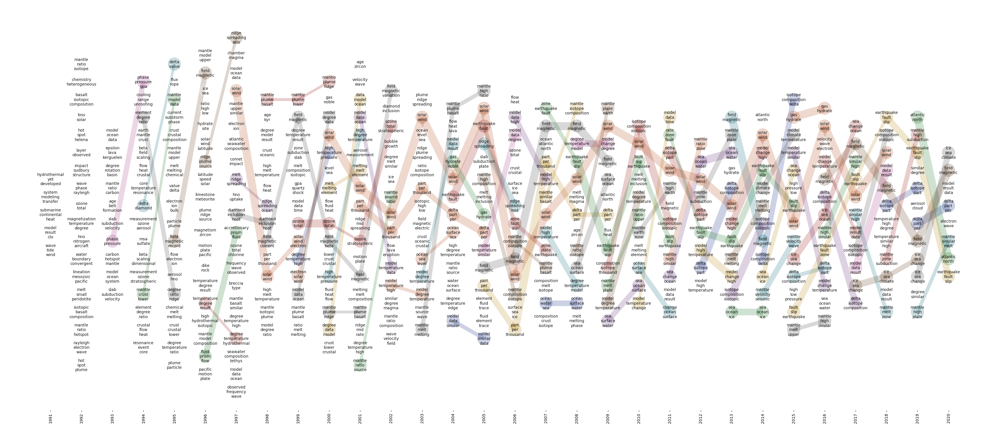

In [842]:
import itertools
import ast

import matplotlib as mpl
mpl.rcParams.update(mpl.rcParamsDefault)

threshold = 0.3

# def jaccard(c1, c2):
#     intersection = set(c1).intersection(set(c2))
#     union = set(c1).union(set(c2))
#     jaccard = len(intersection) / len(union)
#     return jaccard

# def weighted_jaccard(c1, c2, weights):
    
#     intersection = set(c1).intersection(set(c2))
#     union = set(c1).union(set(c2))
    
#     weighted_intersection = sum(weights[term] for term in intersection)
#     weighted_union = sum(weights[term] for term in union)

#     if weighted_union == 0:
#         return 0.0
#     else:
#         return weighted_intersection / weighted_union

tree = nx.DiGraph()

for t in sorted(Gs_temporal.keys())[:-1]:

    G_t = Gs_temporal[t]
    G_t1 = Gs_temporal[t+1]

    comms_t = nx_comm.louvain_communities(G_t, seed=123)
    comms_t1 = nx_comm.louvain_communities(G_t1, seed=123)

    cent_t = nx.betweenness_centrality(G_t)
    cent_t1 = nx.betweenness_centrality(G_t1)

    coreness_t = nx.core_number(G_t)
    coreness_t1 = nx.core_number(G_t1)

    for comm_t, comm_t1 in itertools.product(comms_t, comms_t1):
        
        if t == 1998 and 'wind' in comm_t:
            print(comm_t)
            print(comm_t1)
            print()

        coreness_comm_t = filter(lambda tup: tup[0] in comm_t, coreness_t.items())
        sorted_coreness_comm_t = sorted(coreness_comm_t, key=lambda tup: tup[1], reverse=True)
        date_coreness_comm_t = [t] + [term for term, _ in sorted_coreness_comm_t]
        node_t = str(date_coreness_comm_t)

        coreness_comm_t1 = filter(lambda tup: tup[0] in comm_t1, coreness_t1.items())
        sorted_coreness_comm_t1 = sorted(coreness_comm_t1, key=lambda tup: tup[1], reverse=True)
        date_coreness_comm_t1 = [t+1] + [term for term, _ in sorted_coreness_comm_t1]
        node_t1 = str(date_coreness_comm_t1)

        rank_t = sum([d['weight'] for (_, _, d) in G_t.subgraph(comm_t).edges(data=True)])
        rank_t1 = sum([d['weight'] for (_, _, d) in G_t1.subgraph(comm_t1).edges(data=True)])

        t_min = min(Gs_temporal.keys())
        if node_t not in tree:
            tree.add_node(node_t, layer=t-t_min, date=t, rank=rank_t)
        if node_t1 not in tree:
            tree.add_node(node_t1, layer=t+1-t_min, date=t+1, rank=rank_t1)

        coreness_t.update(coreness_t1)
        similarity = weighted_jaccard(comm_t, comm_t1, coreness_t, coreness_t1)

        if similarity >= threshold:
            tree.add_edge(node_t, node_t1, similarity=similarity)

pos = nx.multipartite_layout(tree, subset_key='layer')

node_size = 1000
alpha = 0.2

node_list = sorted(tree.nodes)
edge_list = sorted(tree.edges)

## Rank Y axis pos by 'rank' attribute

node_pos_layers = defaultdict(dict)
node_rank_layers = defaultdict(dict)
for (node, attrs) in tree.nodes(data=True):
    node_pos_layers[attrs['layer']][node] = pos[node]
    node_rank_layers[attrs['layer']][node] = attrs['rank']

node_pos_layers = dict(sorted(node_pos_layers.items(), key=lambda tup: tup[0]))
node_rank_layers = dict(sorted(node_rank_layers.items(), key=lambda tup: tup[0]))

node_pos_layers = [sorted(layer.items(), key=lambda tup: tup[1][1], reverse=True) for layer in node_pos_layers.values()]
node_rank_layers = [sorted(layer.items(), key=lambda tup: tup[1], reverse=True) for layer in node_rank_layers.values()]

for node_pos, node_rank in zip(node_pos_layers, node_rank_layers):
    node_pos = [node for node, _ in node_pos]
    node_rank = [node for node, _ in node_rank]
    for u, v in zip(node_pos, node_rank):
        pos[u], pos[v] = pos[v], pos[u]

## NODE LABELS

node_labels = {}
for node in node_list:
    term_list = ast.literal_eval(node)
    node_str = '\n'.join(term_list[1:4])
    node_labels[node] = node_str

node_labels = dict(sorted(node_labels.items(), key=lambda tup: tup[0]))

## NODE & EDGE COLOR

connected_components = list(nx.weakly_connected_components(tree))
color_palette = sns.color_palette('dark', n_colors=len(connected_components))

node_colors = {}
for i, component in enumerate(connected_components):

    if len(component) > 1:
        for node in component:
            node_colors[node] = color_palette[i]
    else:
        for node in component:
            node_colors[node] = 'white'

edge_colors = {}
for i, component in enumerate(connected_components):
    for edge in tree.subgraph(component).edges():
        edge_colors[edge] = color_palette[i]

node_colors = sorted(node_colors.items(), key=lambda tup: tup[0])
node_colors = list(map(lambda tup: tup[1], node_colors))
edge_colors = sorted(edge_colors.items(), key=lambda tup: tup[0])
edge_colors = list(map(lambda tup: tup[1], edge_colors))

## EDGE WIDTH 

edge_width = [tree[e[0]][e[1]]['similarity']*20 for e in edge_list]

fig, ax = plt.subplots(1, figsize=(35, 15))

nx.draw_networkx_nodes(
    tree, 
    pos,
    nodelist=node_list,
    node_size=node_size,
    node_color=node_colors,
    node_shape='o',
    alpha=alpha,
    # cmap=plt.cm.Blues,
    ax=ax,
)

nx.draw_networkx_labels(G, pos=pos, ax=ax, labels=node_labels, font_size=10)

nx.draw_networkx_edges(
    tree, 
    pos,
    edgelist=edge_list,
    width=edge_width,
    style='solid',
    alpha=alpha,
    arrowsize=10,
    arrows=False,
    ax=ax,
    edge_color=edge_colors,
    nodelist=node_list,
    node_size=node_size,
    node_shape='o',
    connectionstyle='arc3',
)

ax.set_facecolor('white')

ax.tick_params(left=False, bottom=True, labelleft=False, labelbottom=True)

xs, _ = zip(*pos.values())
ax.set_xticks(sorted(set(xs)))
ax.set_xticklabels(sorted(Gs_temporal.keys()), rotation=90)

ax.set_xlim(min(xs)-0.1, max(xs)+0.1)

for pos in ['right', 'top', 'bottom', 'left']:
   plt.gca().spines[pos].set_visible(False)

plt.tight_layout()
plt.show()

# Local Measurements

In [95]:
def centrality(G):
    return nx.betweenness_centrality(G)

def coreness(G):
    return nx.core_number(G)

measures = [centrality, coreness]

In [1]:



for measure in measures:

    vals = []
    for year, df in dfs.items():

        G = nx.Graph()
        G.add_weighted_edges_from(df.rows())

        vals.append(measure(G))
        
    df = pl.DataFrame(vals)

    x = list(dfs.keys())
    ys = df
    
    fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
    trace = ax.plot(x, ys, linewidth=3)

    ax.set_xlabel('Year', fontsize=10)
    ax.set_ylabel(f'{measure.__name__}', fontsize=10)
    ax.set_title(f'{field_name} - {measure.__name__}', fontsize=12)
    ax.grid(True, which="both", ls="--", c='0.7')

    ax.set_facecolor('white')
    ax.spines['bottom'].set_color('0.7')
    ax.spines['top'].set_color('0.7')
    ax.spines['right'].set_color('0.7')
    ax.spines['left'].set_color('0.7')

    ax.legend(trace, [s.name for s in ys], facecolor='white', framealpha=1, loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()

In [119]:
df_measurement = []

for year, df in dfs.items():

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())
    measure = nx.betweenness_centrality(G)

    communities = nx_comm.louvain_communities(G)

    measurement = {}

    for community in communities:
        
        community_measure = np.mean([measure[node] for node in community])

        G_sub = G.subgraph(community)
        centralities = nx.betweenness_centrality(G_sub)
        community_name = sorted(centralities.items(), key=lambda d: d[1], reverse=True)
        community_name = ' '.join([name[0] for name in community_name[:2]])

        measurement[community_name] = community_measure

    df_measurement.append(measurement) 

In [121]:
df = pl.DataFrame(df_measurement)

In [40]:
x = range(1992, 2021)
ys = df

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
trace = ax.plot(x, ys, linewidth=3)

ax.set_xlabel('Year', fontsize=10)
# ax.set_ylabel(f'{measure.__name__}', fontsize=10)
# ax.set_title(f'{field_name} - {measure.__name__}', fontsize=12)
ax.grid(True, which="both", ls="--", c='0.7')

ax.set_facecolor('white')
ax.spines['bottom'].set_color('0.7')
ax.spines['top'].set_color('0.7')
ax.spines['right'].set_color('0.7')
ax.spines['left'].set_color('0.7')

ax.legend(trace, [s.name for s in ys], facecolor='white', framealpha=1, loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [141]:
field_name = 'Sociology'
dfs = df_temporal[field_name]
df = dfs[2020]
G_full = nx.Graph()
G_full.add_weighted_edges_from(df.rows())

communities = nx_comm.louvain_communities(G_full)
communities = {node: i for i, community in enumerate(communities) for node in community}

In [154]:
df_measurement = []
years = []
for year, df in dfs.items():

    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())
    measure = nx.betweenness_centrality(G)

    

    measurement = defaultdict(list)

    for node, score in measure.items():
        try:
            node_community = communities[node]
            measurement[node_community].append(score)
        except:
            continue
        
    measurement = {str(community): np.mean(measures) for community, measures in measurement.items()}
    
    df_measurement.append(measurement)
    years.append(year)

df = pl.DataFrame(df_measurement)

    

In [39]:
x = years
ys = df

fig, ax = plt.subplots(nrows=1, ncols=1, figsize=(12, 6))
trace = ax.plot(x, ys, linewidth=3)

ax.set_xlabel('Year', fontsize=10)
# ax.set_ylabel(f'{measure.__name__}', fontsize=10)
# ax.set_title(f'{field_name} - {measure.__name__}', fontsize=12)
ax.grid(True, which="both", ls="--", c='0.7')

ax.set_facecolor('white')
ax.spines['bottom'].set_color('0.7')
ax.spines['top'].set_color('0.7')
ax.spines['right'].set_color('0.7')
ax.spines['left'].set_color('0.7')

ax.legend(trace, [s.name for s in ys], facecolor='white', framealpha=1, loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()


In [240]:
field_name = 'Sociology'
dfs = dfs_temporal[field_name]

In [241]:
Gs = []
for year, df in dfs.items():
    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())

    Gs.append(G)

G_composed = nx.Graph()
for G in Gs:
    G_composed = nx.compose(G_composed, G)

nodes = list(G_composed.nodes())
nodes[:5]

['child', 'school', 'enrollment', 'evidence', 'theory']

In [242]:
df_measurement = []
years = []
for year, df in dfs.items():
    if year < 1995:
        continue
    G = nx.Graph()
    G.add_weighted_edges_from(df.rows())
    measure = nx.betweenness_centrality(G)
    all_nodes = dict.fromkeys(nodes)
    all_nodes.update(measure)
    df_measurement.append(all_nodes)
    years.append(year)

df = pl.DataFrame(df_measurement)
df.head()

child,school,enrollment,evidence,theory,black,industry,white,employment,rate,county,populist,organization,relationship,state,transformation,lynching,opportunity,depressed,labor,social,competition,type,income,inequality,dismissal,job,movement,size,failure,increased,hmo,national,schooling,indicate,south,carolina,...,area,capital,population,participation,level,policy,marriage,status,neighborhood,parental,public,course,sociology,infant,mortality,result,two,marital,mother,form,show,theoretical,sociological,review,finding,identity,author,survey,based,behavior,health,find,context,one,time,science,student
f64,f64,f64,bool,f64,f64,bool,f64,f64,f64,bool,bool,f64,f64,f64,bool,bool,bool,bool,f64,f64,bool,bool,f64,f64,bool,f64,f64,bool,bool,bool,bool,f64,bool,bool,bool,bool,...,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64,f64
0.093798,0.112793,0.0,null,0.082186,0.037082,null,0.026213,0.0,0.10423,null,null,0.026213,null,0.100207,null,null,null,null,0.0,0.572953,null,null,0.039031,0.075132,null,null,null,null,null,null,null,null,null,null,null,null,...,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
0.000452,0.0,null,null,0.101278,0.27898,null,0.010244,null,0.056581,null,null,null,null,0.072512,null,null,null,null,0.0,0.514819,null,null,0.028168,0.003701,null,null,0.0,null,null,null,null,0.0,null,null,null,null,...,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
0.044212,0.0,null,null,0.076016,0.078283,null,0.000939,null,0.114554,null,null,0.047887,0.0,0.004883,null,null,null,null,0.024145,0.552515,null,null,0.042643,0.003957,null,0.0,0.0,null,null,null,null,0.0,null,null,null,null,...,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
0.032301,0.0,null,null,0.059701,0.158375,null,0.000528,null,0.109227,null,null,0.027589,0.0,0.00294,null,null,null,null,0.027589,0.701794,null,null,0.033205,0.003015,null,null,0.0,null,null,null,null,null,null,null,null,null,...,0.0,0.0,0.0,0.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null
0.034381,0.0,null,null,0.0501,0.128142,null,0.000956,null,0.056922,null,null,0.031694,0.0,0.036311,null,null,null,null,0.031694,0.771985,null,null,0.000546,0.012204,null,null,0.0,null,null,null,null,0.0,null,null,null,null,...,0.0,0.0,null,null,0.0,0.0,0.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null


In [243]:
df_gt = (
    pl.concat([
        df
        .select(
            pl.all().mean(),
        ),
        df
        .select(
            pl.all().var(),
        )
    ])
    .transpose(column_names=['Mean', 'Var'], include_header=True, header_name='Term')
    .filter(
        pl.col('Mean').ge(pl.col('Mean').median()) | pl.col('Var').ge(pl.col('Mean').var())
    )
)

nodes = df_gt['Term'].to_list()

# nodes.remove('social')
nodes[:3]

['child', 'school', 'theory']